# **TP 02 Traitement d'image : Filtrage spatial et fréquentiel des images numériques**

#**Noms & Prénoms** :

*  Sarah BOUARABA
*  Rayane KIMOUCHE



#**Spécialité** :  Data Science & Intelligence Artificielle

---

#**Partie I : Filtrage Spatial** 



#Manipulation 01 : Réduction de bruit


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import cmath
import os

I. Lecture & affichage de l'image "isabelle.bmp"


(512, 512)
uint8


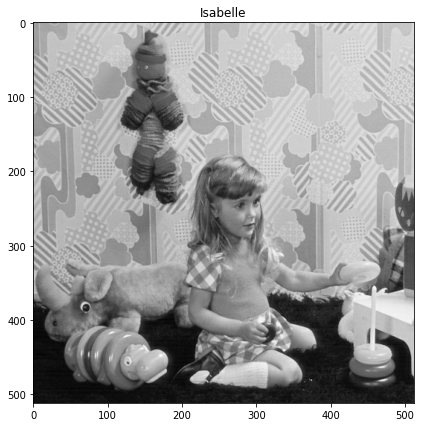

In [ ]:
plt.figure(figsize=(7, 7))


img = cv.imread('isabelle.bmp',0)
plt.imshow(img,cmap="gray")
plt.title("Isabelle")
print(img.shape) 
print(img.dtype)

II. Rajout d'un bruit gaussien & affichage de l'image


Text(0.5, 1.0, 'Isabelle bruitée avec bruit gaussien')

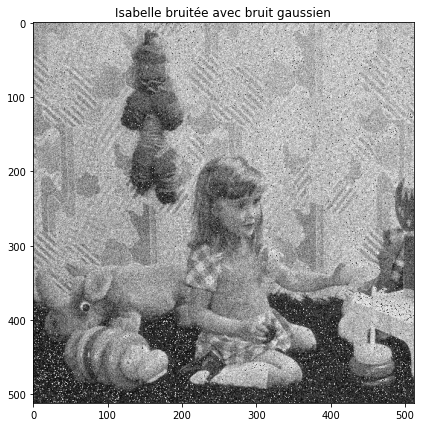

In [ ]:
plt.figure(figsize=(7, 7))

mean = 0
sigma = 0.1 #Pour bien remarquer le bruit sur l'image il suffit d'augmenter σ 

g = np.random.normal(mean,sigma,img.shape)
gauss = np.multiply(g,255)
noisy = (img + gauss).astype(np.uint8)
plt.imshow(noisy, cmap="gray")
plt.title("Isabelle bruitée avec bruit gaussien")


**A. Filtre Moyenneur**

(512, 512)
(512, 512)
(512, 512)
(512, 512)


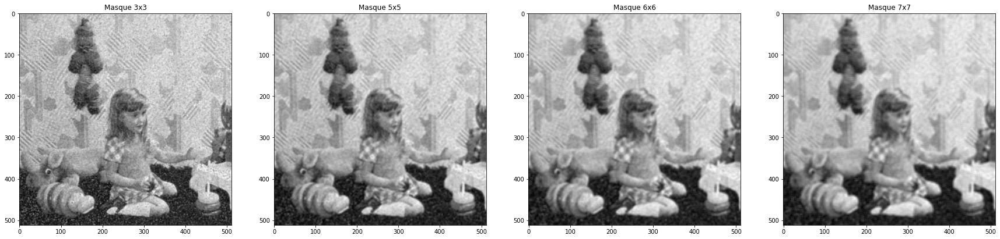

In [ ]:
#1. 

plt.figure(figsize=(30, 30))

#Filtrage moyen 3x3
fm1= cv.blur(noisy, (3, 3)).astype(np.uint8)
plt.subplot(1,4,1)
plt.title("Masque 3x3")
plt.imshow(fm1, cmap="gray")
print(fm1.shape) 

#Filtrage moyen 5x5
fm2= cv.blur(noisy, (5, 5)).astype(np.uint8)
plt.subplot(1,4,2)
plt.title("Masque 5x5")
plt.imshow(fm2, cmap="gray")
print(fm2.shape) 

#Filtrage moyen 6x6
fm3= cv.blur(noisy, (6, 6)).astype(np.uint8)
plt.subplot(1,4,3)
plt.title("Masque 6x6")
plt.imshow(fm3, cmap="gray")
print(fm3.shape) 

#Filtrage moyen 7x7
fm4= cv.blur(noisy, (7, 7)).astype(np.uint8)
plt.subplot(1,4,4)
plt.title("Masque 7x7")
plt.imshow(fm4, cmap="gray")
print(fm4.shape)

Commentaires : 

* On remarque que les 4 masques ont réduit le bruit gaussien mais ils ont rajouté du flou à des degrés différents : plus on augmente la taille du filtre, plus l'image devient floue, plus on perd ses détails.



* Taille des image filtrées obtenues : (512,512) , restées les memes, ce qui est logique car on a pas effectué une réduction de volume sur l'image originale, mais plutot une réduction de bruit.

* Les bords ont été traités par défaut (borderType = BORDER_DEFAULT), c'est une méthode qui rajoute du padding à l'extérieure de l'image en considérant le pixel traité comme point de réflexion "1 |1 2 3 5| 3" .

* Changement de méthode : on peut utiliser la méthode de convolution linéaire (valeurs nulles), de convolution partielle, ou encore le mirroir de l'image.

---

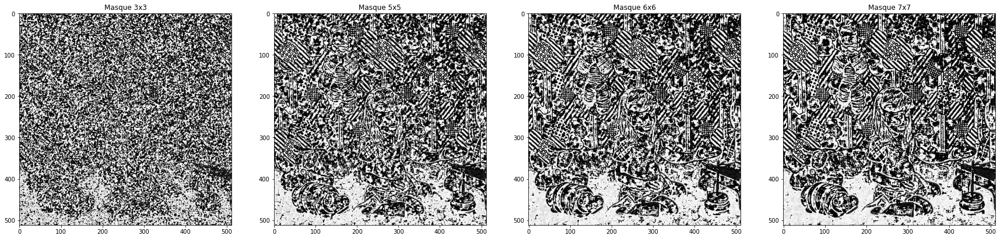

In [ ]:
#2. 

plt.figure(figsize=(30, 30))


#Soustraction entre l’image originale et l’image filtrée 3x3
sous1 = img - fm1
plt.subplot(1,4,1)
plt.title("Masque 3x3")
plt.imshow(sous1.astype(np.uint8), cmap="gray")

#Soustraction entre l’image originale et l’image filtrée 5x5
sous2 = img - fm2
plt.subplot(1,4,2)
plt.title("Masque 5x5")
plt.imshow(sous2.astype(np.uint8), cmap="gray")

#Soustraction entre l’image originale et l’image filtrée 6x6
sous3 = img - fm3
plt.subplot(1,4,3)
plt.title("Masque 6x6")
plt.imshow(sous3.astype(np.uint8), cmap="gray")

#Soustraction entre l’image originale et l’image filtrée 7x7
sous4 = img - fm4
plt.subplot(1,4,4)
plt.title("Masque 7x7")
plt.imshow(sous4.astype(np.uint8), cmap="gray")


Commentaire : 

La soustraction entre l'image originale et les images filtrées montre qu'il y a une différence entre eux. Il y a des détails manquants sur les images filtrées par rapport à l'image originale à des degrés différents, ce qui logique car on avait déjà dit que plus on augmente la taille du filtre, plus l'image devient floue, plus on perd les détails de l'image.
donc :
*   la différence entre l'image originale et chaque image filtrée est expliquée par la perte de détails (lissage) de l'image originale après le filtrage.
*   Le degré de différence varie entre les images filtrées, ceci provient du fait que plus augmente la taille du filtre, plus l'image devient floue, plus on perd les détails de l'image, et donc plus la différence entre l'image originale et l'image filtrée est importante.






**Conclusion :**

Les filtres appliqués sont des filtres moyenneurs pour la réduction de bruit. Ce sont des filtres passe-bas effectuant un lissage sur l'image bruitée en faisant une moyenne dans un voisinage 3x3 , 5x5 , 6x6 et 7x7 respectivement (matrices de convolution avec tous les coefficients identiques et leur somme qui vaut 1).
Plus on augmente la taille du filtre moyenneur plus l'image filtrée est floue, plus on perd les détails de l'image (lissage).

---

**B. Filtre Gaussien**

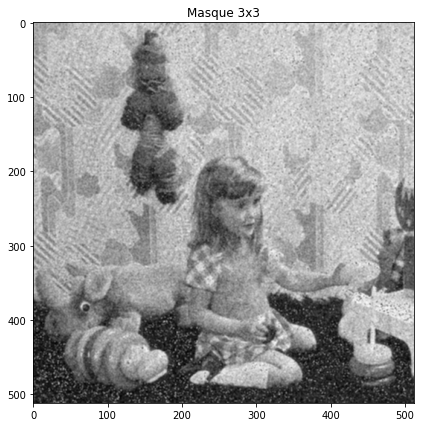

In [ ]:
#1. Filtrage gaussien 3x3 σ = 1

plt.figure(figsize=(7, 7))

fg1 = cv.GaussianBlur(noisy, (3, 3), 1)
plt.title("Masque 3x3")
plt.imshow(fg1.astype(np.uint8), cmap="gray")


Commentaire : On remarque que le filtre gaussien a éliminé le bruit gaussien en rajoutant moins de floue par rapport au filtre moyenneur.

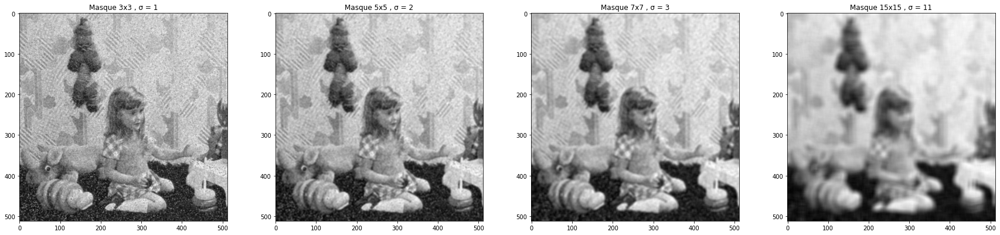

In [ ]:
#2. Etude de l’influence de la taille du filtre et de la valeur de l’écart-type σ :


plt.figure(figsize=(30, 30))

#Filtre gaussien 3x3 , σ = 1
fg1 = cv.GaussianBlur(noisy, (3, 3), 1)
plt.subplot(4,4,1)
plt.title("Masque 3x3 , σ = 1")
plt.imshow(fg1.astype(np.uint8), cmap="gray")

#Filtre gaussien 5x5 , σ = 2
fg2 = cv.GaussianBlur(noisy, (5, 5), 2)
plt.subplot(4,4,2)
plt.title("Masque 5x5 , σ = 2")
plt.imshow(fg2.astype(np.uint8), cmap="gray")

#Filtre gaussien 7x7 , σ = 3
fg3 = cv.GaussianBlur(noisy, (7, 7), 3)
plt.subplot(4,4,3)
plt.title("Masque 7x7 , σ = 3")
plt.imshow(fg3.astype(np.uint8), cmap="gray")

#Filtre gaussien 15x15 , σ = 11
fg4 = cv.GaussianBlur(noisy, (15, 15), 11)
plt.subplot(4,4,4)
plt.title("Masque 15x15 , σ = 11")
plt.imshow(fg4.astype(np.uint8), cmap="gray")

Commentaire : 

Le degré de lissage est fortement lié à l'écart type 𝜎, plus on augmente l’écart-type σ plus on rajoute du floue à l'image filtrée, mais on doit agrandir le filtre pour chaque augmentation de 𝜎 .

---

3. Le masque qui semble meilleur pour σ = 1 : 

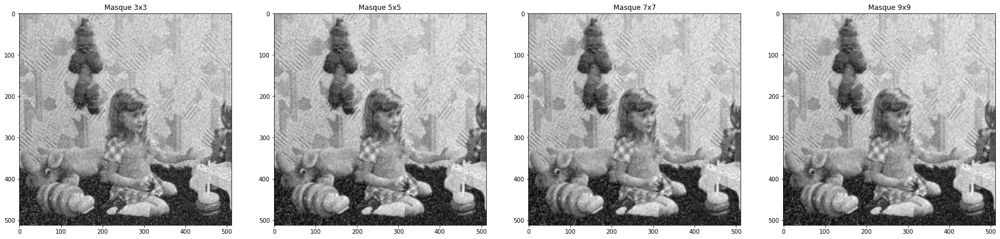

In [ ]:
plt.figure(figsize=(30, 30))

#Filtre gaussien 3x3 , σ = 1
fg1 = cv.GaussianBlur(noisy, (3, 3), 1)
plt.subplot(1,4,1)
plt.title("Masque 3x3")
plt.imshow(fg1.astype(np.uint8), cmap="gray")

#Filtre gaussien 5x5 , σ = 1
fg5 = cv.GaussianBlur(noisy, (5, 5), 1)
plt.subplot(1,4,2)
plt.title("Masque 5x5")
plt.imshow(fg5.astype(np.uint8), cmap="gray")

#Filtre gaussien 7x7 , σ = 1
fg6 = cv.GaussianBlur(noisy, (7,7), 1)
plt.subplot(1,4,3)
plt.title("Masque 7x7")
plt.imshow(fg6.astype(np.uint8), cmap="gray")

#Filtre gaussien 9x9 , σ = 1
fg7 = cv.GaussianBlur(noisy, (9, 9), 1)
plt.subplot(1,4,4)
plt.title("Masque 9x9")
plt.imshow(fg7.astype(np.uint8), cmap="gray")



-> Le masque qui semble meilleur pour σ = 1 est le masque dont la largeur du filtre devrait être 6σ +1, c'est à dire : **le masque 7x7**

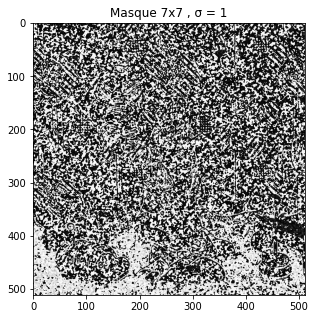

In [ ]:
#Soustraction entre l’image originale et l’image filtrée ( 7x7 , σ = 1 ):

plt.figure(figsize=(5, 5))

sous = img - fg6
plt.title("Masque 7x7 , σ = 1")
plt.imshow(sous.astype(np.uint8), cmap="gray")


Commentaire :  

Il y a moins de différence par rapport à l'image filtrée par le filtre moyenneur, c'est-à-dire il y a moins de détails manquants, le filtre gaussien a donc bien réduit le bruit tout en préservant les contours.

---

**C. Filtre Médian**

(512, 512)
(512, 512)
(512, 512)
(512, 512)


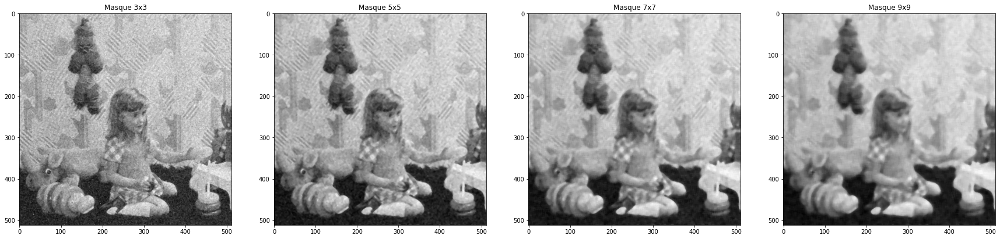

In [ ]:
#1. 

plt.figure(figsize=(30, 30))

noisy = noisy.astype('uint8')

#Filtrage médian 3x3
fmed1= cv.medianBlur(noisy, 3)
plt.subplot(1,4,1)
plt.title("Masque 3x3")
plt.imshow(fmed1, cmap="gray")
print(fmed1.shape) 

#Filtrage médian 5x5
fmed2= cv.medianBlur(noisy, 5)
plt.subplot(1,4,2)
plt.title("Masque 5x5")
plt.imshow(fmed2, cmap="gray")
print(fmed2.shape) 

#Filtrage médian 7x7
fmed3= cv.medianBlur(noisy, 7)
plt.subplot(1,4,3)
plt.title("Masque 7x7")
plt.imshow(fmed3, cmap="gray")
print(fmed3.shape) 

#Filtrage médian 9x9
fmed4= cv.medianBlur(noisy, 9)
plt.subplot(1,4,4)
plt.title("Masque 9x9")
plt.imshow(fmed4, cmap="gray")
print(fmed4.shape)

Comparaison & conclusion : Le filtre médian réduit le bruit mais rajoute du floue, plus on augmente la taille du filtre, plus l'image devient floue.



2. La taille du filtre qui semble meilleur : **5x5**


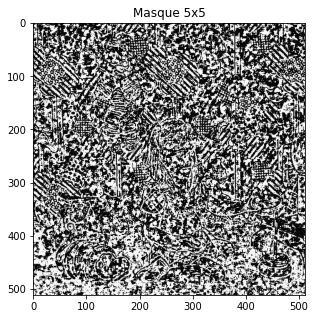

In [ ]:
#Soustraction entre l’image originale et l’image filtrée :

plt.figure(figsize=(5, 5))

sous3 = img - fmed2
plt.title("Masque 5x5")
plt.imshow(sous3.astype(np.uint8), cmap="gray")

Commentaire : 

Il y a une différence entre l'image filtrée et l'image originale qui est expliquée par l'élimination des détails de l'image causée par le floue rajouté par le filtre.

III. Comparaison des 3 filtres :

* Les 3 filtres sont des filtres passe-bas pour la réduction de bruit (dans ce cas, le bruit est gaussien), ils rajoutent du floue à l'image, éliminent ses détails et donc effectuent un lissage.

* Le filtre gaussien et le filtre moyenneur sont des filtres linéaires (filtrage par convolution), tandis que le filtre médian est non-linéaire qui fait
intervenir les pixels voisins suivant une loi non-linéaire


* Le filtre moyenneur a réussi à réduire le bruit gaussien mais en rajoutant du floue à l'image, ce qui nous a fait perdre beaucoup de détails (élimination des contours).

* Le filtre gaussien réduit le bruit encore mieux tout en évitant de flouter l'image autant que le filtre moyenneur et en conservant les contours.

* Bien qu'il est adapté aux bruits impulsionnels, le filtre médian a réduit aussi le bruit assez bien.

---



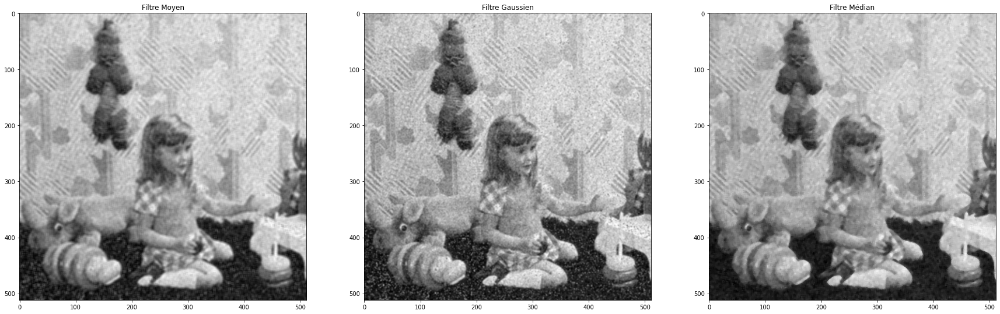

In [ ]:
#Comparaison :

plt.figure(figsize=(30, 30))

#Filtrage moyen 5x5
fm2= cv.blur(noisy, (5, 5))
plt.subplot(1,3,1)
plt.title("Filtre Moyen")
plt.imshow(fm2.astype(np.uint8), cmap="gray")

#Filtre gaussien 5x5 , σ = 1
fg = cv.GaussianBlur(noisy, (5, 5), 1)
plt.subplot(1,3,2)
plt.title("Filtre Gaussien")
plt.imshow(fg.astype(np.uint8), cmap="gray")

#Filtrage médian 5x5
fmed2= cv.medianBlur(noisy, 5)
plt.subplot(1,3,3)
plt.title("Filtre Médian")
plt.imshow(fmed2.astype(np.uint8), cmap="gray")


Le filtre le plus adapté au bruit gaussien est : **le filtre gaussien**.

---

IV. Refaire l’étude des 3 filtres pour un bruit impulsionnel de 0.1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


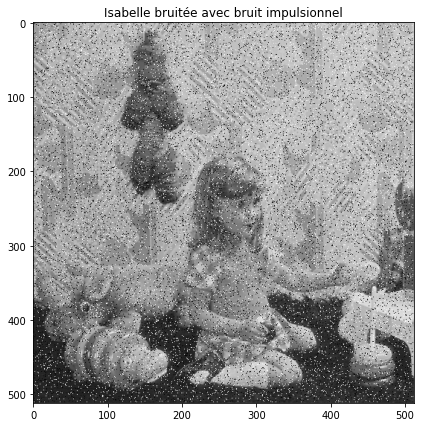

In [ ]:
#Fonction bruit impulsionnel (Poivre & sel)

def impulse(img,amount):
    row,col = img.shape
    s_vs_p = 0.5
    out = np.copy(img)
    # Salt mode
    num_salt = np.ceil(amount * img.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt))
            for i in img.shape]
    out[coords] = 255

    # Pepper mode
    num_pepper = np.ceil(amount* img.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
            for i in img.shape]
    out[coords] = 0
    return out
    
#Rajout du bruit impulsionnel à l'image Isabelle   

plt.figure(figsize=(7, 7))
   
img_impul = impulse(img,0.1)
plt.title("Isabelle bruitée avec bruit impulsionnel")
plt.imshow(img_impul.astype(np.uint8), cmap="gray")

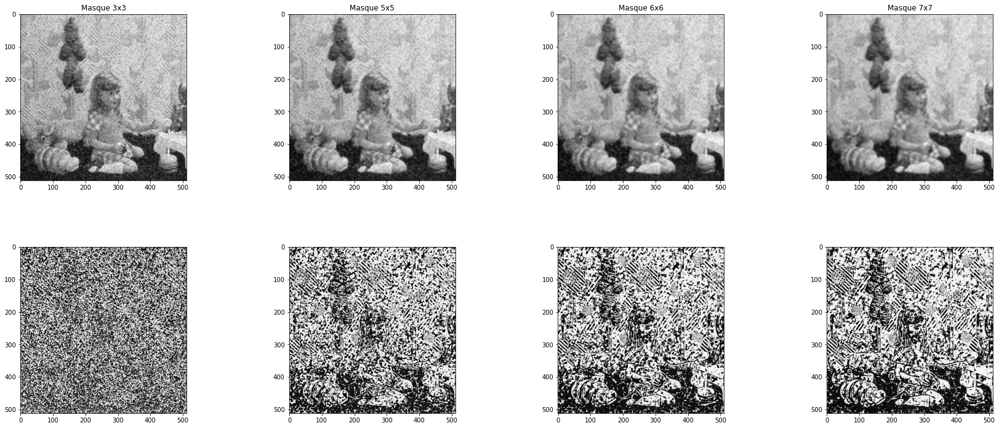

In [ ]:
#Filtres Moyenneurs 

plt.figure(figsize = (30, 30))
plt.subplots_adjust(left = 0.125, right = 0.9, bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dim = [3, 5, 6, 7]
Moy = []

for i in range(len(filter_dim)):
    plt.subplot(2, 4, i+1)
    Moy.append(cv.blur(img_impul, (filter_dim[i], filter_dim[i])))
    plt.imshow(Moy[i].astype(np.uint8), cmap="gray")
    plt.title("Masque " + str(filter_dim[i]) + "x" + str(filter_dim[i]))

for i in range(len(filter_dim)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow((Moy[i] - img).astype(np.uint8), cmap="gray")

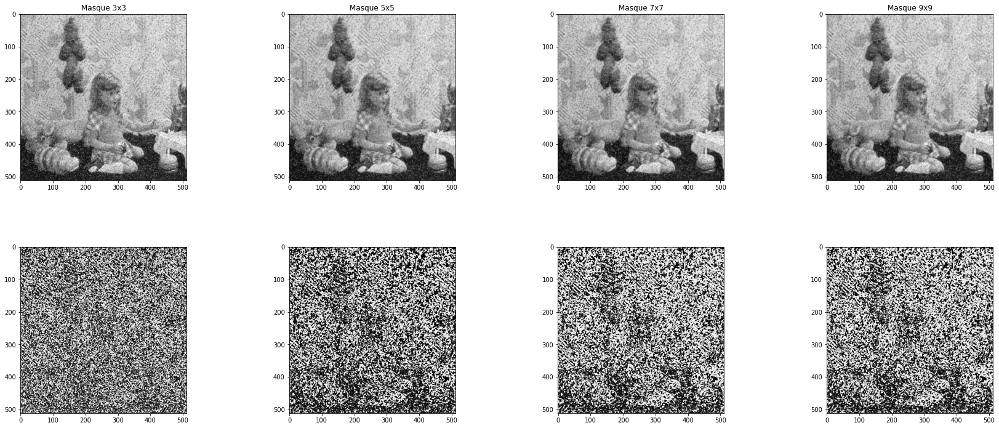

In [ ]:
#Filtres Gaussiens

plt.figure(figsize = (30, 30))
plt.subplots_adjust(left = 0.125, right = 0.9, bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

filter_dim = [3, 5, 7, 9]
Gauss = []

for i in range(len(filter_dim)):
    plt.subplot(2, 4, i+1)
    Gauss.append(cv.GaussianBlur(img_impul, (filter_dim[i], filter_dim[i]), 1))
    plt.imshow(Gauss[i].astype(np.uint8), cmap="gray")
    plt.title("Masque " + str(filter_dim[i]) + "x" + str(filter_dim[i]))

for i in range(len(filter_dim)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow((Gauss[i] - img).astype(np.uint8), cmap="gray")


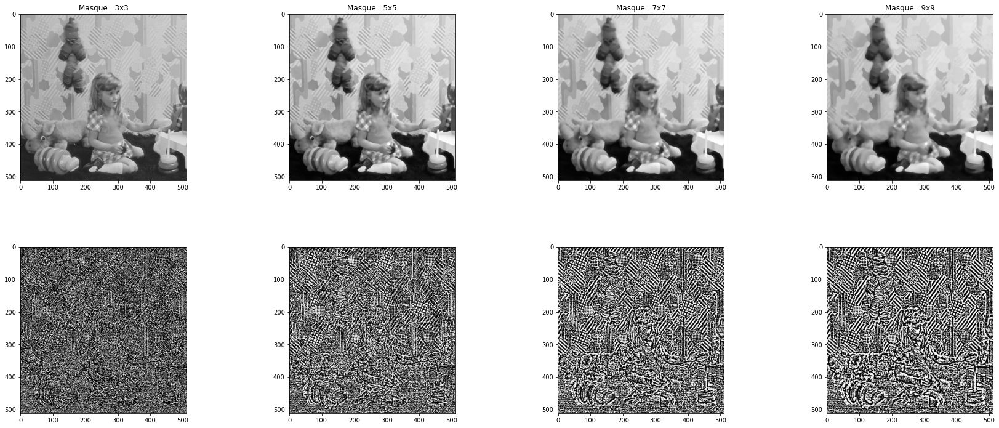

In [ ]:
#Filtres Médian

plt.figure(figsize = (30, 30))
plt.subplots_adjust(bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)


img_impul = img_impul.astype(np.uint8)
filter_dim = [3, 5, 7, 9]
med = []

for i in range(len(filter_dim)):
    plt.subplot(2, 4, i+1)
    med.append(cv.medianBlur(img_impul, filter_dim[i], filter_dim[i]))
    plt.imshow(med[i].astype(np.uint8), cmap="gray")
    plt.title("Masque : " + str(filter_dim[i]) + "x" + str(filter_dim[i]))

for i in range(len(filter_dim)):
    plt.subplot(2, 4, 4+i+1)
    plt.imshow((med[i] - img).astype(np.uint8), cmap="gray")

Comparaison entre les 3 filtres :

* Le filtre moyenneur a réduit le bruit impulsionnel mais a éliminé les contours. En augmentant la taille du filtre l'image devient floue et on perd ses détails, on remarque ceci dans la différence entre l'image originale et les images filtrées.

* Le filtre gaussien a réduit le bruit tout en évitant de floutter l'image, ce qui se voit dans les images représentant la différence entre l'image bruitée et l'image filtrée.

* Le filtre médian par contre a fait une très bonne réduction de bruit, il l'a nettoyer tout en préservant les contours de l'image, ce qui se voit dans les images représentant la différence entre l'image bruitée et l'image filtrée.




Le filtre le plus adapté au bruit impulsionnel est : **le filtre médian**

---

V. Augmentation du pourcentage des pixels remplacés :



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


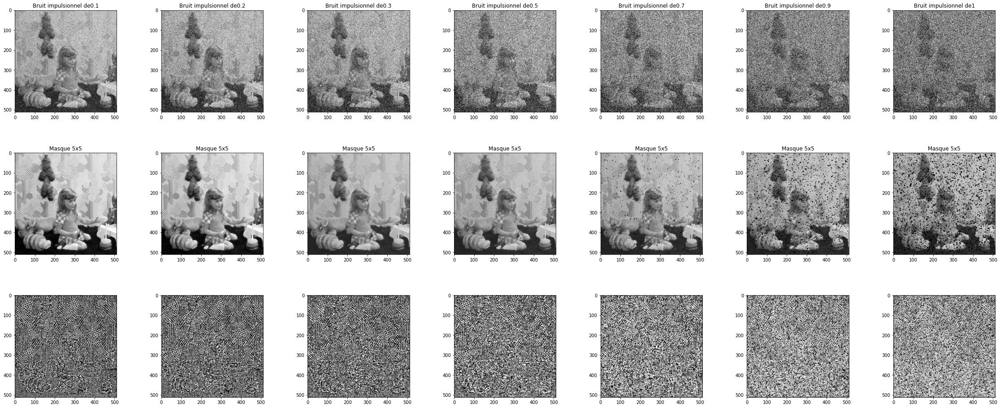

In [ ]:
#Filtre 5x5

plt.figure(figsize = (40, 40))

plt.subplots_adjust(bottom = 0.0, top = 0.3, wspace = 0.2, hspace = 0.4)

amount = [0.1, 0.2, 0.3, 0.5, 0.7, 0.9, 1]
pvnoise = []
med = []
for i in range(len(amount)):
    plt.subplot(3, 7, i+1)
    pvnoise.append(impulse(img,amount[i]))
    plt.imshow(pvnoise[i].astype(np.uint8), cmap="gray")
    plt.title("Bruit impulsionnel de" + str(amount[i]))

    plt.subplot(3, 7, i+8)
    med.append(cv.medianBlur(pvnoise[i], 5, 5))
    plt.imshow(med[i].astype(np.uint8), cmap="gray")
    plt.title("Masque 5x5")

    plt.subplot(3, 7, i+15)
    plt.imshow((med[i] - img).astype(np.uint8), cmap="gray")
    

* En augmentant le pourcentage de pixels remplacés, le filtre médian ne 
reste pas toujours performant. 
* On remarque qu'il n'est plus performant à partir de 60% de perturbations, ce qui est logique, car les pixels bruités à partir de ce niveau seront dominantes dans l'image donc impossible de restituer tout les pixels, parce que à un stade élevé de bruitage le voisinage d'un pixel est presque tout bruité donc choisir la médiane est une mauvaise solution.
* Pour conclure : on peut dire que le filtre médian est efficace pour le bruit impulsionnel mais a des limites. 

**Synthèse Manip 01 :**

* Les filtres passe-bas ont pour but de réduire les bruits dans les images, en ajoutant du floue, c'est-à-dire l'élimination des détails de l'image (les contours), et donc le lissage.
* Il existe 3 types essentiels de filtres passe-bas : moyenneur & gaussien (linéaires), et médian (non linéaire)
* Le filtre moyenneur effectue un lissage sur une image bruitée en faisant une moyenne dans un voisinage de taille d "taille du filtre" (matrice de convolution avec tout les coefficients identiques et leur somme vaut 1). Plus on augmente la taille du filtre d, plus le lissage est important, plus l'image sera floue, plus on perd ses détails.
* Le filtre gaussien a une logique analogique au filtre moyenneur, son effet est similaire à celui du filtre moyenneur mais la moyenne est pondérée dans le sens où les pixels près du pixel central ont un poids plus important que ceux qui sont situés plus loin (apporte plus d'importance au pixel central).
Le filtre gaussien rajoute moins de floue par rapport au filtre moyenneur, et il est le plus adapté au bruit gaussien.
* Le filtre médian effectue un lissage sur une image bruitée en remplaçant la valeur d'un pixel par la valeur médiane dans son voisinage NxN. Il est le plus adapté au bruit impulsionnel (poivre & sel), il le nettoie tout en préservant les contours de l'image mais a des limites : il ne devient plus performant dans le cas où le pourcentage des pixels remplacés est élevé.

---

#Manipulation 02 : Détection des contours

1. Lecture & affichage de "lena.png"

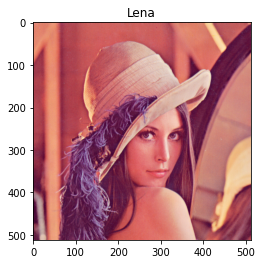

In [ ]:
lena = cv.imread("lena.png")
lena = cv.cvtColor(lena, cv.COLOR_BGR2RGB)
plt.title("Lena")
plt.imshow(lena)

2.Transformation de l'image en niveaux de gris

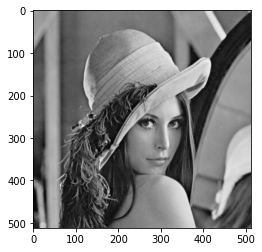

In [ ]:
img = cv.cvtColor(lena, cv.COLOR_RGB2GRAY)
plt.imshow(img, cmap="gray")

3. Gradient : Sobel, Prewitt, Robert

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:105: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:105: RuntimeWarning: invalid value encountered in true_divide


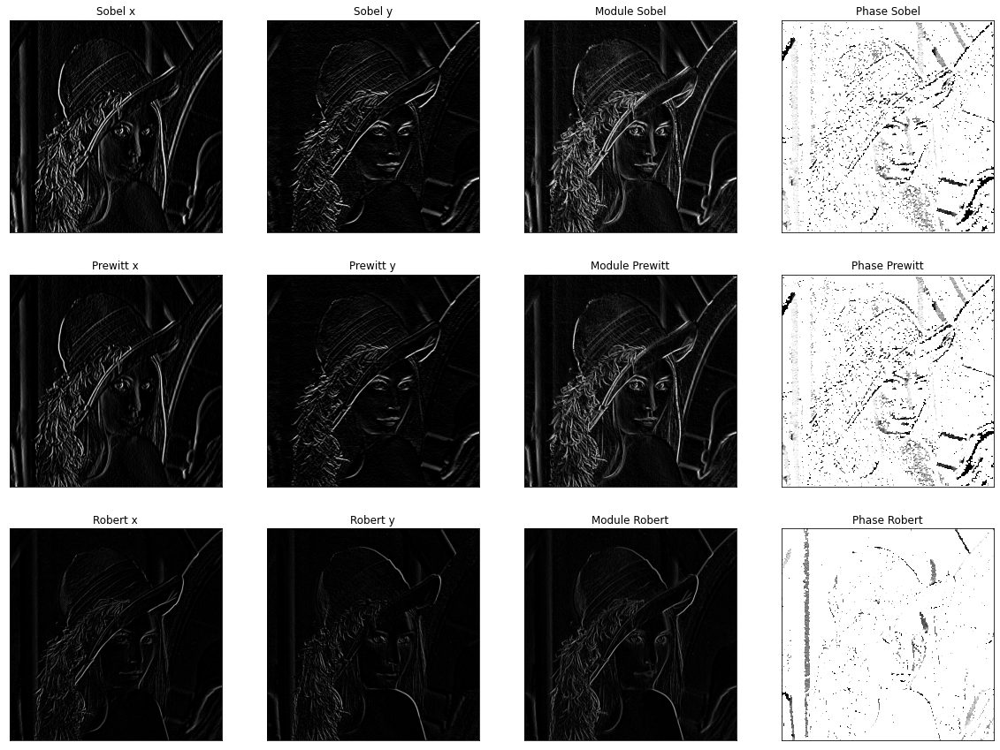

In [ ]:
plt.figure(figsize = (20, 15))

#Filtre de Sobel 

kernelxs = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
kernelys = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])

sobelx = cv.filter2D(img, -1, kernelxs)
sobely = cv.filter2D(img, -1, kernelys)

plt.subplot(3,4,1)
plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel x')
plt.xticks([])
plt.yticks([])

plt.subplot(3,4,2)
plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel y')
plt.xticks([])
plt.yticks([])

module_sobel_carre=np.square(sobelx.astype(np.float32))+np.square(sobely.astype(np.float32))

module_sobel=np.sqrt(module_sobel_carre)
module_sobel=np.uint8(module_sobel)

phase_sobel=np.arctan(sobely/sobelx)

plt.subplot(3,4,3)
plt.imshow(module_sobel,cmap = 'gray')
plt.title('Module Sobel')
plt.xticks([])
plt.yticks([])

plt.subplot(3,4,4)
plt.imshow(phase_sobel,cmap = 'gray')
plt.title('Phase Sobel')
plt.xticks([])
plt.yticks([])

#Filtre de Prewitt

kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])

prewittx = cv.filter2D(img, -1, kernelx)
prewitty = cv.filter2D(img, -1, kernely)

plt.subplot(3,4,5)
plt.imshow(prewitty,cmap = 'gray')
plt.title('Prewitt x')
plt.xticks([])
plt.yticks([])

plt.subplot(3,4,6)
plt.imshow(prewittx,cmap = 'gray')
plt.title('Prewitt y')
plt.xticks([])
plt.yticks([])

module_prewitt_carre=np.square(prewittx.astype(np.float32))+np.square(prewitty.astype(np.float32))

module_prewitt=np.sqrt(module_prewitt_carre)
module_prewitt=np.uint8(module_prewitt)

phase_prewitt=np.arctan(prewitty/prewittx)

plt.subplot(3,4,7)
plt.imshow(module_prewitt,cmap = 'gray')
plt.title('Module Prewitt')
plt.xticks([])
plt.yticks([])

plt.subplot(3,4,8)
plt.imshow(phase_prewitt,cmap = 'gray')
plt.title('Phase Prewitt')
plt.xticks([])
plt.yticks([])

# Filtre de Robert
kernelxr = np.array([[0,-1],[1,0]])
kernelyr = np.array([[1,0],[0,-1]])

robertx = cv.filter2D(img, -1, kernelxr)
roberty = cv.filter2D(img, -1, kernelyr)

plt.subplot(3,4,9)
plt.imshow(roberty,cmap = 'gray')
plt.title('Robert x')
plt.xticks([])
plt.yticks([])

plt.subplot(3,4,10)
plt.imshow(robertx,cmap = 'gray')
plt.title('Robert y')
plt.xticks([])
plt.yticks([])

module_robert_carre=np.square(robertx.astype(np.float32))+np.square(roberty.astype(np.float32))

module_robert=np.sqrt(module_robert_carre)
module_robert=np.uint8(module_robert)

phase_robert=np.arctan(roberty/robertx)

plt.subplot(3,4,11)
plt.imshow(module_robert,cmap = 'gray')
plt.title('Module Robert')
plt.xticks([])
plt.yticks([])

plt.subplot(3,4,12)
plt.imshow(phase_robert,cmap = 'gray')
plt.title('Phase Robert')
plt.xticks([])
plt.yticks([])

plt.show()

Comparaison des 3 opérateurs :

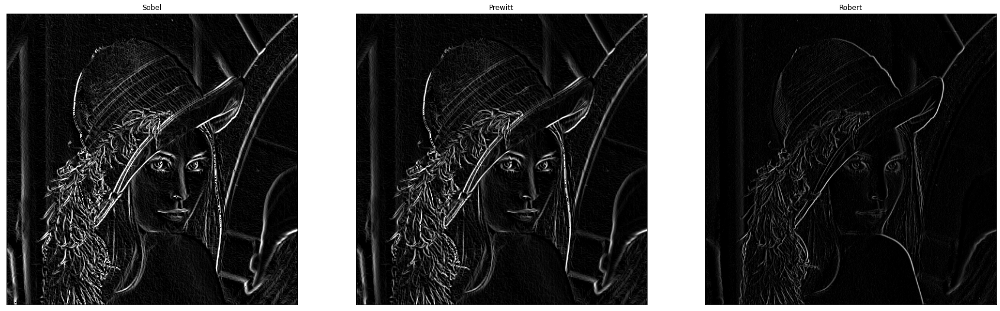

In [ ]:
plt.figure(figsize=(30, 30))

plt.subplot(1,3,1),plt.imshow(module_sobel,cmap = 'gray')
plt.title('Sobel'), plt.xticks([]), plt.yticks([])

plt.subplot(1,3,2),plt.imshow(module_prewitt,cmap = 'gray')
plt.title('Prewitt'), plt.xticks([]), plt.yticks([])

plt.subplot(1,3,3),plt.imshow(module_robert,cmap = 'gray')
plt.title('Robert'), plt.xticks([]), plt.yticks([])

plt.show()

* On remarque que les 3 filtres épaississent les contours dans cet ordre : Robert -> Prewitt -> Sobel.

* On voit bien que le filtre de Robert détecte les contours moins que le filtre de Prewitt & Sobel.

* Le filtre de Sobel donne une meilleure estimation de celui de Prewitt car la série [1,2,1] approxime une gaussiène, tandis que la série [1,1,1] approxime une moyenne. Cependant, les 2 filtres épaississent les contours et le filtre de Sobel les épaissit davantage.

---

4. Le Laplacien 4 & 8 connexité

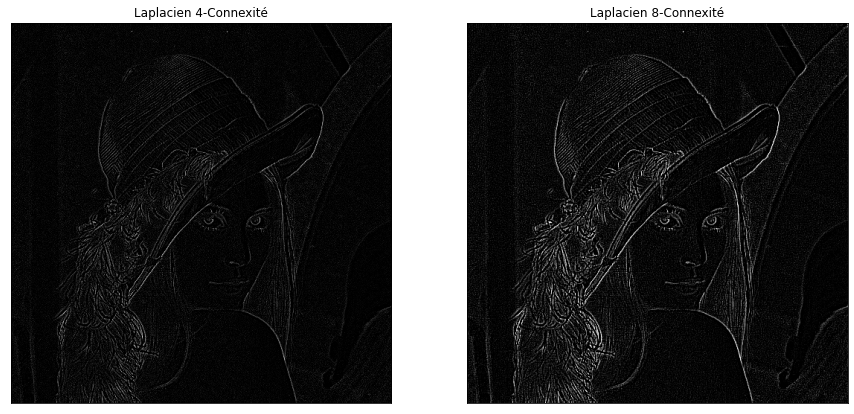

In [ ]:
plt.figure(figsize=(15, 15))

kernel4 = np.array([[0,1,0],[1,-4,1],[0,1,0]])
laplacien4connex = cv.filter2D(img, -1, kernel4)

kernel8 = np.array([[1,1,1],[1,-8,1],[1,1,1]])
laplacien8connex = cv.filter2D(img, -1, kernel8)

plt.subplot(1,2,1)
plt.imshow(laplacien4connex,cmap = 'gray')
plt.title('Laplacien 4-Connexité')
plt.xticks([])
plt.yticks([])

plt.subplot(1,2,2)
plt.imshow(laplacien8connex,cmap = 'gray')
plt.title('Laplacien 8-Connexité')
plt.xticks([])
plt.yticks([])

plt.show()

Comparaison : Le Laplacien 8-connexité détecte mieux les contours de l'image que le Laplacien 4-connexité mais rajoute du bruit à l'image.

5. Application d'un filtrage gaussien avant de calculer le Laplacien 8-connexité


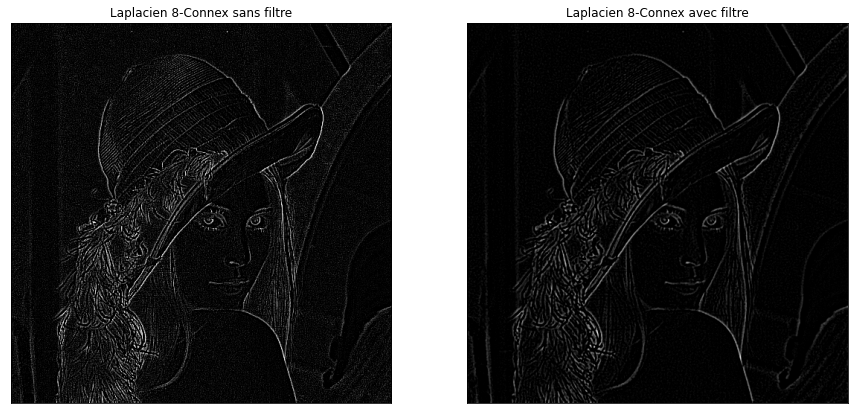

In [ ]:
plt.figure(figsize=(15, 15))

gauss = cv.GaussianBlur(img,(3,3),1)

laplacien_gauss_8connex = cv.filter2D(gauss, -1, kernel8)

plt.subplot(1,2,1)
plt.imshow(laplacien8connex,cmap = 'gray')
plt.title('Laplacien 8-Connex sans filtre')
plt.xticks([])
plt.yticks([])

plt.subplot(1,2,2)
plt.imshow(laplacien_gauss_8connex,cmap = 'gray')
plt.title('Laplacien 8-Connex avec filtre')
plt.xticks([])
plt.yticks([])

plt.show()

Le bruit a été réduit en appliquant le filtre gaussien avant de calculer le Laplacien 8-connexité, mais les contours ont été doublés.

6. Application de la méthode d’amélioration du Laplacien par seuillage

Text(0.5, 1.0, 'Laplacien 8-connexité')

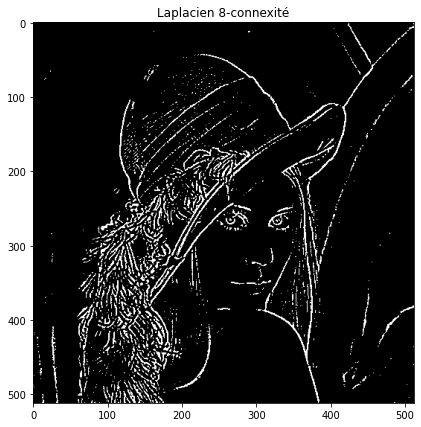

In [ ]:
plt.figure(figsize=(7, 7))

ret, newImg = cv.threshold(laplacien_gauss_8connex, 0, 255, cv.THRESH_OTSU )
plt.imshow(newImg, cmap="gray")
plt.title('Laplacien 8-connexité')

#La fonction "TRESH_OTSU" s'occupe de choisir le meilleur seuil

En voulant remédier au problème de doublage des contours en utilisant la méthode d'amélioration par seuillage, on a eu un autre problème qui est la discontinuité (contours ouverts).

**7. Synthèse Manip 03 + Comparaison entre les différents filtres appliqués pour la détection de contours :**

Les opérations de détection de contours ont pour but de transformer une image en une autre image de même dimension dans laquelle les contours apparaissent par convention en blanc sur un fond noir, en utilisant des filtres passe-haut pour l'accentuation des détails de l'image et l'élimination des régions homogènes. Il existe 2 approches de détection de contours :

*   Approche gradient : Filtres de Sobel, Prewitt et Robert.
*   Approche Laplacien : Laplacien 8-connexité et 4-connexité.

Le filtre de Sobel donne une meilleure estimation que celui de Prewitt car la série [1,2,1] est approximativement une gaussiènne, tandis que la série [1,1,1] approxime une moyenne. Cependant, les 2 filtres épaississent les contours mais celui de Sobel les épaissit davantage.

Les filtres de 1ère dérivée sont moins sensibles aux bruits car ils ont des filtres passe-bas en quelque sorte à l'intérieur (On avait déjà dit que les 2 séries [1,2,1] & [1,1,1] approximment respectivement une gaussiènne et une moyenne).

Le filtre Laplacien 8-connexité définit mieux les contours de l'image que le Laplacien 4-connexités mais rajoute beaucoup de bruit à l'image. Ceci est dû au fait que les filtres de 2ème dérivée sont très sensibles aux bruits. En essayant d'appliquer un filtre gaussien avant de calculer le Laplacien 8-connexité, on améliore le résultat (élimination de bruit), mais on obtient en ravanche les doubles contours. Afin de remédier à ce problème, on applique la méthode d'amélioration par seuillage, celle-ci donne un résultat très correct représentant fidèlement les contours de l'image mais causant en contre partie le problème de discontinuité (contours ouverts). La difficulté de la méthode réside dans le choix du seuil à utiliser mais la fonction "cv.THRESH_OTSU" peut nous aider à trouver le meilleur seuil automatiquement.

---

#**Partie II : Filtrage Fréquentiel** 



1. Lecture & affichage de l'image "goldhill.bmp"

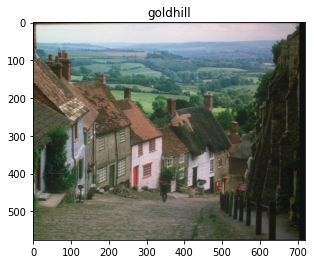

In [ ]:
gold = cv.imread("goldhill.bmp")
goldhill = cv.cvtColor(gold, cv.COLOR_BGR2RGB)
plt.title("goldhill")
plt.imshow(goldhill)

2. Transformation de l'image en niveaux de gris

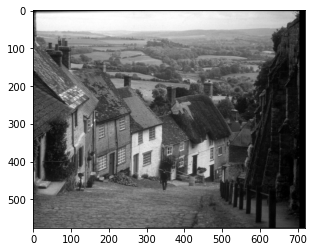

In [ ]:
img = cv.cvtColor(goldhill, cv.COLOR_RGB2GRAY)
plt.imshow(img, cmap="gray")

3. Rajout d'un bruit gaussien à l'image

Text(0.5, 1.0, 'goldhill bruitée avec bruit gaussien')

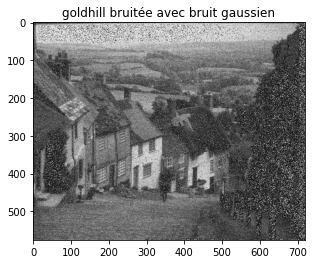

In [ ]:
mean = 0
sigma = 0.1  

g = np.random.normal(mean,sigma,img.shape)
gauss = np.multiply(g,255)
noisy = (img + gauss).astype(np.uint8)
plt.imshow(noisy, cmap="gray")
plt.title("goldhill bruitée avec bruit gaussien")

4/5. Calcul de la transformée de Fourier discrète & affichage du spectre de l'image

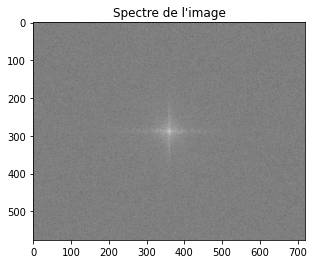

In [ ]:
f = np.fft.fft2(noisy)
fshift = np.fft.fftshift(f)
mag_spectrum = 20*np.log(np.abs(fshift))
plt.imshow(mag_spectrum,cmap='gray')
plt.title("Spectre de l'image")
plt.show()

**Filtrage passe-bas**

6. Génération et affichage de la fonction de transfert H1 du filtre

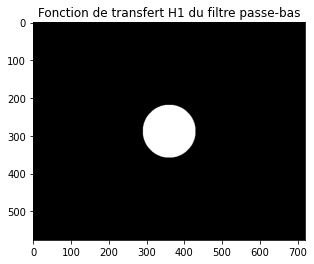

In [ ]:
nl, nc = noisy.shape

D1 = 70
x = np.arange(-nl/2, nl/2, 1)
y = np.arange(-nc/2, nc/2, 1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx * xx + yy * yy)
H1 = z < D1
plt.title("Fonction de transfert H1 du filtre passe-bas")
plt.imshow(H1, cmap='gray')

7. Multiplication du spectre de l’image par la fonction de transfert H1

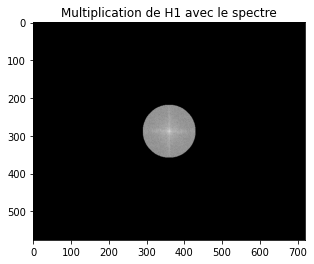

In [ ]:
spectre_transfer_passebas = H1*mag_spectrum
plt.imshow(spectre_transfer_passebas,cmap='gray')
plt.title("Multiplication de H1 avec le spectre")
plt.show()

8/9 . Transformée de Fourier inverse & affichage du résultat

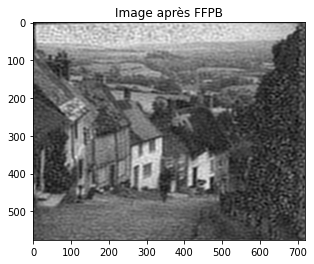

In [ ]:
f_ishift_bas = np.fft.ifftshift(fshift*H1)
img_bas = np.fft.ifft2(f_ishift_bas)
img_bas = np.real(img_bas)
img_bas = np.uint8(img_bas)
plt.imshow(img_bas,cmap='gray')
plt.title("Image après FFPB")
plt.show()

10. **Filtrage passe-haut**

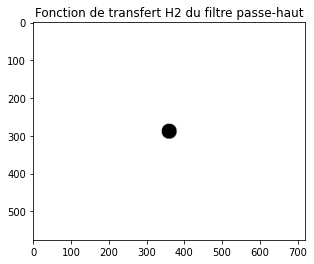

In [ ]:
nl , nc = noisy.shape
D2 = 20
x = np.arange(-nl/2,nl/2,1)
y = np.arange(-nc/2,nc/2,1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx*xx+yy*yy)
H2 = z > D2
plt.imshow(H2,cmap='gray')
plt.title("Fonction de transfert H2 du filtre passe-haut")
plt.show()


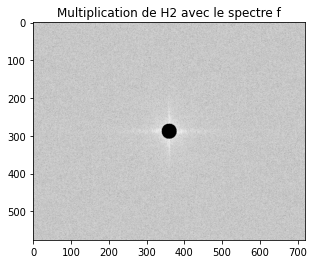

In [ ]:
spectre_transfer_passehaut = H2*mag_spectrum
plt.imshow(spectre_transfer_passehaut,cmap='gray')
plt.title("Multiplication de H2 avec le spectre f")
plt.show()

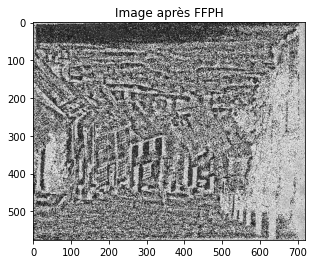

In [ ]:
f_ishift_haut = np.fft.ifftshift(fshift*H2)
img_haut = np.fft.ifft2(f_ishift_haut)
img_haut = np.real(img_haut)
img_haut = np.uint8(img_haut)

plt.imshow(img_haut,cmap='gray')
plt.title("Image après FFPH")
plt.show()

11. **Filtrage passe-bande**

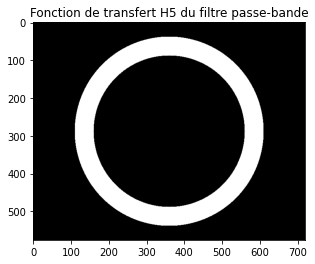

In [ ]:
nl , nc = noisy.shape
D3 = 200
D4 = 250
x = np.arange(-nl/2,nl/2,1)
y = np.arange(-nc/2,nc/2,1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx*xx+yy*yy)
H3 = z < D4
H4 = D3 < z
H5 = H3*H4
plt.imshow(H5,cmap='gray')
plt.title("Fonction de transfert H5 du filtre passe-bande")
plt.show()

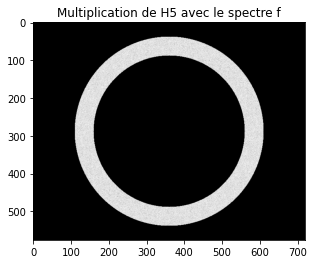

In [ ]:
spectre_transfer_passebande = H5*mag_spectrum
plt.imshow(spectre_transfer_passebande,cmap='gray')
plt.title("Multiplication de H5 avec le spectre f")
plt.show()

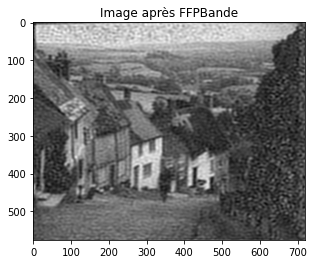

In [ ]:
f_ishift_bande = np.fft.ifftshift(fshift*H5)
img_bande = np.fft.ifft2(f_ishift_bande)
img_bande = np.real(img_bande)
img_bande = np.uint8(img_bande)
plt.imshow(img_bas,cmap='gray')
plt.title("Image après FFPBande")
plt.show()

**Conclusion** :

Le filtrage en fréquence consiste à filtrer une image en modifiant son spectre, on applique donc le filtrage dans le domaine fréquentiel.

Ceci permet de contrôler l’action réalisée sur chacune des fréquences de l’image. Ainsi, on peut décider d’atténuer les hautes fréquences ou au contraire de les amplifier.

Le principe du filtrage fréquentiel consiste à :
* Calculer la TFD de l'image bruitée
* Calculer la fonction de transfert H du filtre
* Multiplier le spectre de l'image bruitée par H
* Calculer la TFD inverse pour enfin avoir l'image filtrée

Il existe 3 types de filtres fréquentiels :
* Filtres passe-bas
* Filtres passe-haut
* Filtres passe-bande

**Les filtres passe-bas :**

Un filtrage passe-bas consiste à conserver les basses fréquences et à supprimer les éléments de l'image qui sont décrits par des hautes fréquences, c'est-à-dire les détails, les textures et les contours. Il réalise donc un lissage (ou floutage) de l'image.

Plus on supprime de hautes fréquences, plus le filtre est étroit, plus le lissage est important, et donc plus l'image est floutée.

**Les filtres passe-haut :**

Inversement, le filtrage passe-haut consiste à conserver les hautes fréquences et supprimer les basses fréquences.

Il produit des valeurs proches de 0 dans les zones unies ou dégradées, qui correspondent aux basses fréquences supprimées par le filtrage, et conserve uniquement les éléments correspondant aux hautes fréquences dans l'image : les détails, textures et contours de l'image.

Le filtrage passe-haut est couramment utilisé pour l'extraction de contours.

**Les filtres passe-bande :**

Un filtre passe-bande est un filtre ne laissant passer qu’une bande ou intervalle de fréquences compris entre une fréquence de coupure basse et une fréquence de coupure haute du filtre.

---